In [1]:
import os
import gzip
import numpy as np
import pandas as pd
import scanpy as sc
import matplotlib.pyplot as plt
import seaborn as sns
import umap
import statsmodels.api as sm
import sklearn.preprocessing
import scipy.sparse
import sklearn.metrics
import sklearn.mixture
import sklearn.linear_model
import scipy.stats as stats
from anndata import AnnData
import scrublet as scr
import scipy.io
import matplotlib.pyplot as plt
import psutil
import os
import matplotlib as mpl
from matplotlib import cm
import gc

sc.settings.set_figure_params(dpi=400)
sc.settings.verbosity = 1  # verbosity: errors (0), warnings (1), info (2), hints (3)
%load_ext rpy2.ipython

sns.set(font_scale=1.5)
plt.style.use('seaborn-white')

sc.logging.print_versions()


Bad key "text.kerning_factor" on line 4 in
/home/gaw006/anaconda3/lib/python3.7/site-packages/matplotlib/mpl-data/stylelib/_classic_test_patch.mplstyle.
You probably need to get an updated matplotlibrc file from
http://github.com/matplotlib/matplotlib/blob/master/matplotlibrc.template
or from the matplotlib source distribution


/home/gaw006/anaconda3/lib/python3.7/site-packages/rpy2/robjects/pandas2ri.py:14: FutureWarning: pandas.core.index is deprecated and will be removed in a future version.  The public classes are available in the top-level namespace.
  from pandas.core.index import Index as PandasIndex


-----
anndata     0.7.4
scanpy      1.6.0
sinfo       0.3.1
-----
PIL                 7.2.0
anndata             0.7.4
backcall            0.2.0
bottleneck          1.3.2
cairo               1.19.1
cffi                1.14.0
cloudpickle         1.6.0
colorama            0.4.3
concurrent          NA
cycler              0.10.0
cython_runtime      NA
cytoolz             0.11.0
dask                2.30.0
dateutil            2.8.1
decorator           4.4.2
encodings           NA
genericpath         NA
get_version         2.1
h5py                2.10.0
igraph              0.8.3
importlib_metadata  1.7.0
ipykernel           5.3.4
ipython_genutils    0.2.0
ipywidgets          7.5.1
jedi                0.17.2
jinja2              2.11.2
joblib              0.16.0
kiwisolver          1.2.0
legacy_api_wrap     0.0.0
leidenalg           0.8.3
llvmlite            0.33.0+1.g022ab0f
louvain             0.6.1
markupsafe          1.1.1
matplotlib          2.2.3
mpl_toolkits        NA
natsort             

# Data

### Download raw and intermediate data from GSE169453

# Cell clustering

In [10]:
## loading raw cell-by-macs2 peaks count matrix
adata_merged=sc.read('/oasis/tscc/scratch/gaw006/share/biobank_snATACseq/all_raw_macs2.h5ad')

## count normalization
adata_merged_raw = sc.pp.log1p(adata_merged, copy=True)
sc.pp.normalize_per_cell(adata_merged, counts_per_cell_after=1e4)



/home/gaw006/anaconda3/lib/python3.7/site-packages/anndata/_core/anndata.py:1094: FutureWarning: is_categorical is deprecated and will be removed in a future version.  Use is_categorical_dtype instead
  if not is_categorical(df_full[k]):


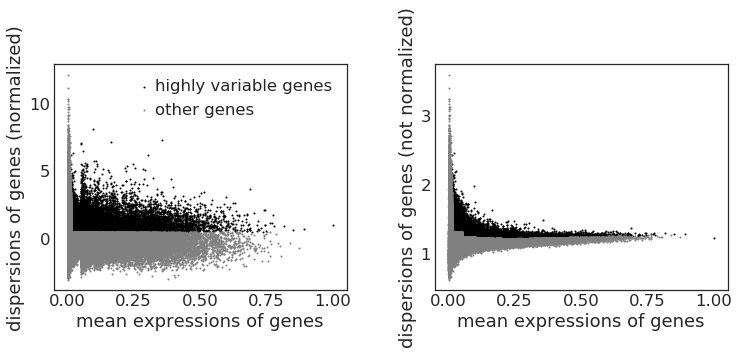

/home/gaw006/anaconda3/lib/python3.7/site-packages/anndata/_core/anndata.py:1094: FutureWarning: is_categorical is deprecated and will be removed in a future version.  Use is_categorical_dtype instead
  if not is_categorical(df_full[k]):


(5202, 361076)
(3995, 361076)
(4689, 361076)
(5338, 361076)
(5759, 361076)
(5452, 361076)
(8426, 361076)
(5004, 361076)
(12001, 361076)
(7620, 361076)
(12669, 361076)
(7023, 361076)
(5172, 361076)
(7603, 361076)
(5423, 361076)
(7537, 361076)
(4968, 361076)
(5166, 361076)
(5518, 361076)
(5590, 361076)
(6194, 361076)
(4917, 361076)
(7132, 361076)
(6162, 361076)
(5938, 361076)
(7171, 361076)
(4042, 361076)
(6240, 361076)
(6845, 361076)
(7039, 361076)
(5149, 361076)
(7097, 361076)
(8883, 361076)
(6009, 361076)
25194


/home/gaw006/anaconda3/lib/python3.7/site-packages/anndata/_core/anndata.py:1094: FutureWarning: is_categorical is deprecated and will be removed in a future version.  Use is_categorical_dtype instead
  if not is_categorical(df_full[k]):


In [11]:
## identify highly variable peaks
adata_merged_filter = sc.pp.filter_genes_dispersion(adata_merged.X, flavor='seurat', n_bins=20)
sc.pl.filter_genes_dispersion(adata_merged_filter, log=False, show=None, save=None)
hvgs = adata_merged.var.loc[adata_merged_filter.gene_subset].index.tolist()

samples_all=sorted(set(adata_merged.obs['donor']))
for sample in samples_all:
    print((adata_merged[adata_merged.obs.index.str.contains(sample+'_'),:].shape))
    adata_merged.var[sample] = (adata_merged_raw.X > 0)[adata_merged.obs.index.str.contains(sample+'_'),:].sum(axis=0).A1
hvgs = adata_merged.var.loc[adata_merged.var.index.isin(hvgs)]
hvgs = hvgs.loc[(hvgs>0).sum(axis=1)>(len(samples_all)-1)].index ### sample_all
adata_merged.var = adata_merged.var.drop(samples_all, axis=1)
print(len(hvgs))

## save highly variable peaks
bar_temp=adata_merged.obs.index[0]
hv_h5ad=adata_merged[adata_merged.obs.index.str.contains(bar_temp), :]
hv_h5ad1=hv_h5ad[:, hv_h5ad.var.index.isin(hvgs)]
hv_h5ad1.write('/projects/sanderlab/gaowei/snATAC_QC/test/hvgs.h5ad') 


In [13]:
## loading count matrix and highly variable peaks
adata_merged=sc.read('/oasis/tscc/scratch/gaw006/share/biobank_snATACseq/all_raw_macs2.h5ad')
adata_merged_orig = adata_merged.copy()
adata_merged_raw = sc.pp.log1p(adata_merged, copy=True)
sc.pp.normalize_per_cell(adata_merged, counts_per_cell_after=1e4)

hvgs_adata=sc.read('/projects/sanderlab/gaowei/snATAC_QC/test/hvgs.h5ad')
hvgs=hvgs_adata.var.index
hvgs

Index(['1:100009692-100010523', '1:100056243-100056880',
       '1:100150933-100151771', '1:100231680-100232472',
       '1:100315024-100316302', '1:100434852-100436233',
       '1:100503099-100504840', '1:100598003-100599181',
       '1:100654016-100654874', '1:100714727-100716165',
       ...
       'X:9713373-9714940', 'X:97322654-97323645', 'X:9775229-9776216',
       'X:9816536-9817687', 'X:99890718-99892161', 'X:9989457-9990993',
       'X:99903910-99905435', 'X:9998149-9999345', 'X:99986148-99987445',
       'Y:59019638-59020382'],
      dtype='object', name='index', length=25194)

In [14]:
## data regression
adata_ind = {}
for sample in sorted(set(adata_merged.obs['donor'])):
    adata_ind[sample] = adata_merged[adata_merged.obs.index.str.contains(sample + '_'), :]
    adata_ind[sample] = adata_ind[sample][:, adata_ind[sample].var.index.isin(hvgs)]
    adata_ind[sample].obs['norm_log_counts'] = np.log(adata_ind[sample].X.sum(axis=1).A1)  ###1,norm_log_counts
    print(adata_ind[sample].X.shape)
    
    sc.pp.log1p(adata_ind[sample])
    adata_ind_orig = adata_merged_orig[adata_merged_orig.obs.index.str.contains(sample + '_'), :]
    adata_ind[sample].obs['log10_usable_counts'] = np.log10(adata_ind_orig[:, adata_ind_orig.var.index.isin(hvgs)].X.sum(axis=1).A1)
    adata_ind[sample].obs['log_usable_counts'] = np.log(adata_ind_orig[:, adata_ind_orig.var.index.isin(hvgs)].X.sum(axis=1).A1)
    sc.pp.regress_out(adata_ind[sample], ['log_usable_counts'])
    sc.pp.scale(adata_ind[sample]) 
    
    adata_ind[sample].write('/oasis/tscc/scratch/gaw006/share/biobank_snATACseq/temp/{}_reg.h5ad'.format(sample))
    adata_ind[sample]=None
    gc.collect()

adata_merged_orig = adata_ind_orig = None
gc.collect()

## aggregate cells from all donors
wd = '/oasis/tscc/scratch/gaw006/share/biobank_snATACseq/temp'
samples_all = ['JYH792','JYH809','MM12','MM51','MM54','MM55','MM56','MM57','MM59','MM60','MM61','MM77','MM78','MM79','MM80','MM81','MM86','MM87','MM88','MM89','MM93','MM94','MM95','MM96','MM97','MM98','MM108','MM109','MM110','MM120','MM121','MM122','MM123','MM124']

adatas = {}
for sample in sorted(samples_all):
    adatas[sample]=sc.read(os.path.join(wd,'{}_reg.h5ad'.format(sample))) 
adata_norm = AnnData.concatenate(adatas['JYH792'],adatas['JYH809'],adatas['MM108'],adatas['MM109'],adatas['MM110'],adatas['MM12'],adatas['MM120'],adatas['MM121'], adatas['MM122'],adatas['MM123'],adatas['MM124'],adatas['MM51'],adatas['MM54'],adatas['MM55'],adatas['MM56'],adatas['MM57'],adatas['MM59'],adatas['MM60'],adatas['MM61'],adatas['MM77'],adatas['MM78'],adatas['MM79'],adatas['MM80'],adatas['MM81'],adatas['MM86'],adatas['MM87'],adatas['MM88'],adatas['MM89'],adatas['MM93'],adatas['MM94'],adatas['MM95'],adatas['MM96'],adatas['MM97'],adatas['MM98'],join='inner',batch_key='donor', index_unique=None)
adatas=None
sc.pp.scale(adata_norm)
adata_norm.write('/oasis/tscc/scratch/gaw006/share/biobank_snATACseq/temp/all_norm.h5ad')

/home/gaw006/anaconda3/lib/python3.7/site-packages/anndata/_core/anndata.py:1094: FutureWarning: is_categorical is deprecated and will be removed in a future version.  Use is_categorical_dtype instead
  if not is_categorical(df_full[k]):
Trying to set attribute `.obs` of view, copying.


(5202, 25194)


Trying to set attribute `.obs` of view, copying.


(3995, 25194)


Trying to set attribute `.obs` of view, copying.


(4689, 25194)


Trying to set attribute `.obs` of view, copying.


(5338, 25194)


Trying to set attribute `.obs` of view, copying.


(5759, 25194)


Trying to set attribute `.obs` of view, copying.


(5452, 25194)


Trying to set attribute `.obs` of view, copying.


(8426, 25194)


Trying to set attribute `.obs` of view, copying.


(5004, 25194)


Trying to set attribute `.obs` of view, copying.


(12001, 25194)


Trying to set attribute `.obs` of view, copying.


(7620, 25194)


Trying to set attribute `.obs` of view, copying.


(12669, 25194)


Trying to set attribute `.obs` of view, copying.


(7023, 25194)


Trying to set attribute `.obs` of view, copying.


(5172, 25194)


Trying to set attribute `.obs` of view, copying.


(7603, 25194)


Trying to set attribute `.obs` of view, copying.


(5423, 25194)


Trying to set attribute `.obs` of view, copying.


(7537, 25194)


Trying to set attribute `.obs` of view, copying.


(4968, 25194)


Trying to set attribute `.obs` of view, copying.


(5166, 25194)


Trying to set attribute `.obs` of view, copying.


(5518, 25194)


Trying to set attribute `.obs` of view, copying.


(5590, 25194)


Trying to set attribute `.obs` of view, copying.


(6194, 25194)


Trying to set attribute `.obs` of view, copying.


(4917, 25194)


Trying to set attribute `.obs` of view, copying.


(7132, 25194)


Trying to set attribute `.obs` of view, copying.


(6162, 25194)


Trying to set attribute `.obs` of view, copying.


(5938, 25194)


Trying to set attribute `.obs` of view, copying.


(7171, 25194)


Trying to set attribute `.obs` of view, copying.


(4042, 25194)


Trying to set attribute `.obs` of view, copying.


(6240, 25194)


Trying to set attribute `.obs` of view, copying.


(6845, 25194)


Trying to set attribute `.obs` of view, copying.


(7039, 25194)


Trying to set attribute `.obs` of view, copying.


(5149, 25194)


Trying to set attribute `.obs` of view, copying.


(7097, 25194)


Trying to set attribute `.obs` of view, copying.


(8883, 25194)


Trying to set attribute `.obs` of view, copying.


(6009, 25194)


In [15]:
#### PCA
adata_norm=sc.read('/oasis/tscc/scratch/gaw006/share/biobank_snATACseq/temp/all_norm.h5ad')
adata_merged=None
adata_merged_raw=None
sc.tl.pca(adata_norm, zero_center=False, random_state=0,svd_solver='arpack')
pc = pd.DataFrame(adata_norm.obsm['X_pca'], columns=['PC{}'.format(i) for i in range(1,51)], index=adata_norm.obs.index)
donor = adata_norm.obs['donor'].tolist()


In [16]:
%%R -i pc -i donor -o harmonized
# -o var, get var from R
# -i var, get var from python

#.libPaths(c('/usr/lib64/R/library','/usr/share/R/library'))
#library(devtools)
#install_github("immunogenomics/harmony")

library(harmony)
library(magrittr)

meta_data=matrix(0,length(donor),2)
meta_data[,1]=as.character(donor)
meta_data[,2]=rownames(pc)
colnames(meta_data)=c('donor','cell')
meta_data=as.data.frame(meta_data)
class(meta_data)

batch <- as.factor(unlist(donor))
harmonized <- HarmonyMatrix(pc, meta_data,vars_use='donor',do_pca=FALSE)
harmonized <- data.frame(harmonized)

R[write to console]: Loading required package: Rcpp

R[write to console]: Harmony 1/10

R[write to console]: 0%   10   20   30   40   50   60   70   80   90   100%

R[write to console]: [----|----|----|----|----|----|----|----|----|----|

R[write to console]: *
R[write to console]: *
R[write to console]: *
R[write to console]: *
R[write to console]: *
R[write to console]: *
R[write to console]: *
R[write to console]: *
R[write to console]: *
R[write to console]: *
R[write to console]: *
R[write to console]: *
R[write to console]: *
R[write to console]: *
R[write to console]: *
R[write to console]: *
R[write to console]: *
R[write to console]: *
R[write to console]: *
R[write to console]: *
R[write to console]: *
R[write to console]: *
R[write to console]: *
R[write to console]: *
R[write to console]: *
R[write to console]: *
R[write to console]: *
R[write to console]: *
R[write to console]: *
R[write to console]: *
R[write to console]: *
R[write to console]: *
R[write to console]: *
R[

R[write to console]: Harmony converged after 6 iterations



In [17]:
# cell cluster UMAP
adata_norm.obsm['X_pca'] = harmonized.values
sc.pp.neighbors(adata_norm, n_neighbors=30, method='umap', metric='cosine', random_state=0, n_pcs=50) ##30, 50
sc.tl.leiden(adata_norm, resolution=1, random_state=0) ###resolution 1.5
sc.tl.umap(adata_norm, min_dist=0.3, random_state=0)   ###0.3
#adata_norm.write('/projects/sanderlab/gaowei/snATAC_QC/V7/h5ad_final/all_final.h5ad')

# UMAP

/home/gaw006/anaconda3/lib/python3.7/site-packages/anndata/compat/__init__.py:161: FutureWarning: Moving element from .uns['neighbors']['distances'] to .obsp['distances'].

This is where adjacency matrices should go now.
  FutureWarning,
/home/gaw006/anaconda3/lib/python3.7/site-packages/anndata/compat/__init__.py:161: FutureWarning: Moving element from .uns['neighbors']['connectivities'] to .obsp['connectivities'].

This is where adjacency matrices should go now.
  FutureWarning,


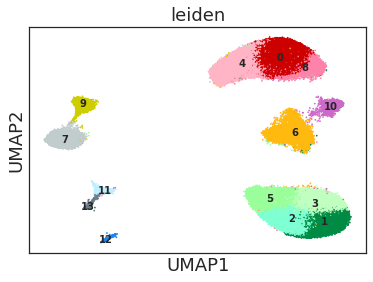

In [2]:
adata_norm=sc.read('/projects/sanderlab/gaowei/snATAC_QC/V7/h5ad_final/all_final.h5ad')
adata_norm.uns['leiden_colors']=['#CD0000','#008B45','#7FFFD4','#C1FFC1','#FFB5C5','#9AFF9A','#FFB90F','#C1CDCD','#FF82AB','#CDCD00','#CD69C9','#BFEFFF','#1C86EE','#6E7B8B']
sc.pl.umap(adata_norm, color=['leiden'], size=12,color_map='Blues',legend_loc='on data',legend_fontsize=10)


## QC for each cluster

In [3]:
adata_merged=sc.read('/oasis/tscc/scratch/gaw006/biobank_snATACseq/all_5kb.h5ad')
adata_merged
np.median(adata_merged.obs['n_counts'])

sc.pp.normalize_per_cell(adata_merged, counts_per_cell_after=1e4)
sc.pp.log1p(adata_merged)
adata_norm.raw=adata_merged
print(all(adata_norm.obs.index==adata_merged.obs.index))

adata_norm.obs['frac_reads_in_peaks']=adata_merged.obs['frac_reads_in_peaks']
adata_norm.obs['frac_reads_in_promoters']=adata_merged.obs['frac_reads_in_promoters']
adata_norm.obs['frac_mito_reads']=adata_merged.obs['frac_mito_reads']


/home/gaw006/anaconda3/lib/python3.7/site-packages/anndata/_core/anndata.py:1094: FutureWarning: is_categorical is deprecated and will be removed in a future version.  Use is_categorical_dtype instead
  if not is_categorical(df_full[k]):


True


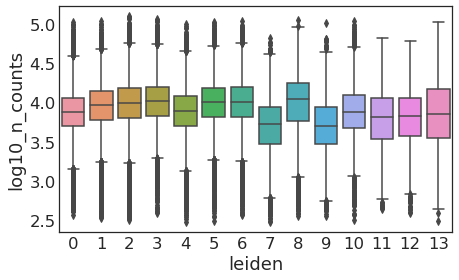

In [4]:
fig, ax1 = plt.subplots(1,1,figsize=(7,4))
sns.boxplot(x='leiden', y='log10_n_counts', data=adata_norm.obs)
plt.show()


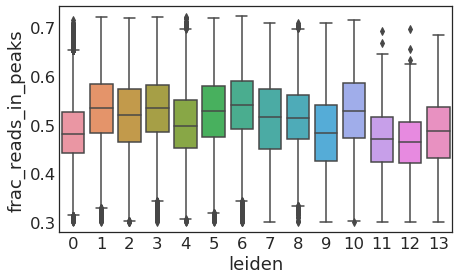

In [5]:
fig, ax1 = plt.subplots(1,1,figsize=(7,4))
sns.boxplot(x='leiden', y='frac_reads_in_peaks', data=adata_norm.obs)
plt.show()


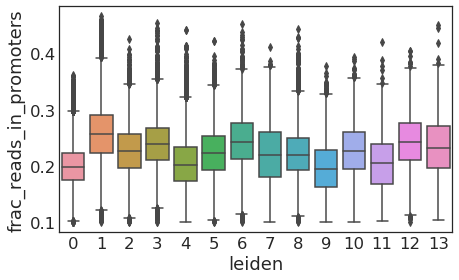

In [6]:
fig, ax1 = plt.subplots(1,1,figsize=(7,4))
sns.boxplot(x='leiden', y='frac_reads_in_promoters', data=adata_norm.obs)
plt.show()


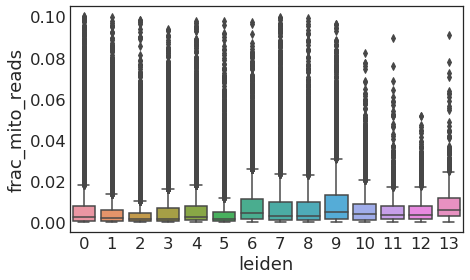

In [7]:
fig, ax1 = plt.subplots(1,1,figsize=(7,4))
sns.boxplot(x='leiden', y='frac_mito_reads', data=adata_norm.obs)
plt.show()


### marker genes promoter accessibility

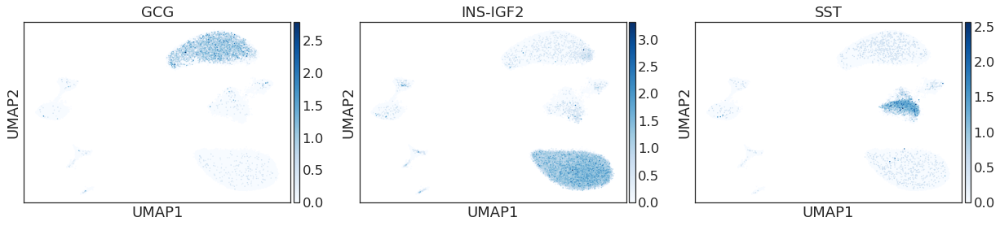

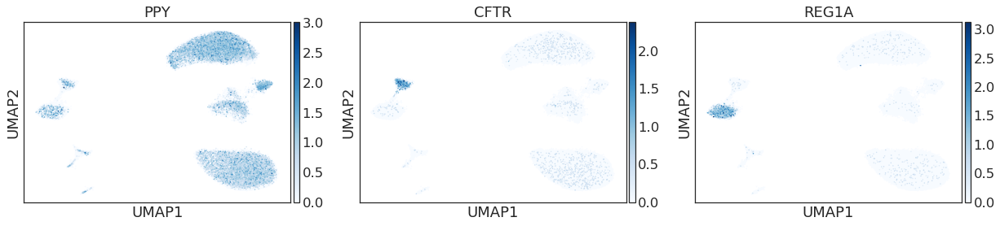

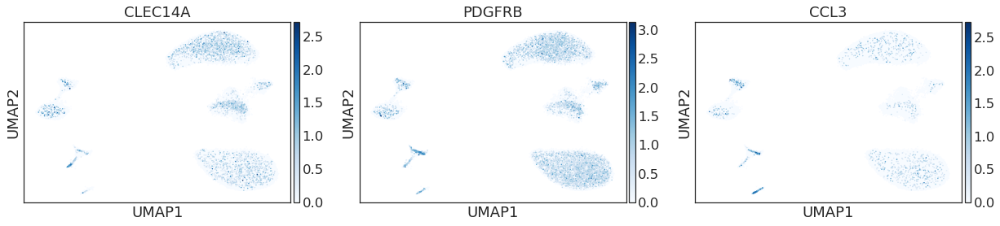

In [8]:
sc.pl.umap(adata_norm, color=['GCG','INS-IGF2','SST'], size=9, color_map='Blues', frameon=True,use_raw=True)
sc.pl.umap(adata_norm, color=['PPY','CFTR','REG1A'], size=9, color_map='Blues', frameon=True,use_raw=True)
sc.pl.umap(adata_norm, color=['CLEC14A','PDGFRB','CCL3'], size=9, color_map='Blues', frameon=True,use_raw=True)


### TF enrichment

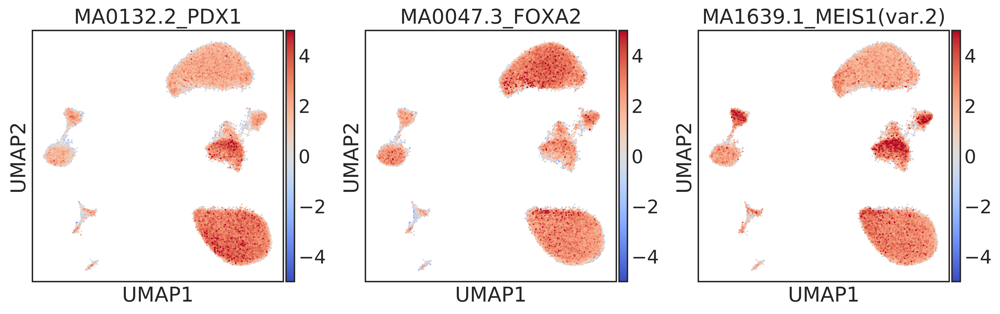

In [4]:
#### UMAP result
adata_norm=sc.read('/projects/sanderlab/gaowei/snATAC_QC/V7/h5ad_final/all_final.h5ad')

### TF motif enrichment from chromVAR
adata_merged=sc.read('/projects/sanderlab/gaowei/snATAC_QC/V8/chromVAR/cell_TF.h5ad')
barcode_raw=adata_merged.obs.index
adata_norm=adata_norm[(adata_norm.obs.index.isin(barcode_raw)),:].copy()

barcode_raw=adata_norm.obs.index
adata_merged=adata_merged[(adata_merged.obs.index.isin(barcode_raw)),:].copy()
all(adata_norm.obs.index==adata_merged.obs.index)
adata_norm.raw=adata_merged
adata_merged.X[(adata_merged.X > 5)]=5
adata_merged.X[(adata_merged.X < (-5))]=(-5)
adata_norm.raw=adata_merged

sc.pl.umap(adata_norm, color=['MA0132.2_PDX1','MA0047.3_FOXA2','MA1639.1_MEIS1(var.2)'], size=9, color_map='coolwarm', frameon=True,use_raw=True)


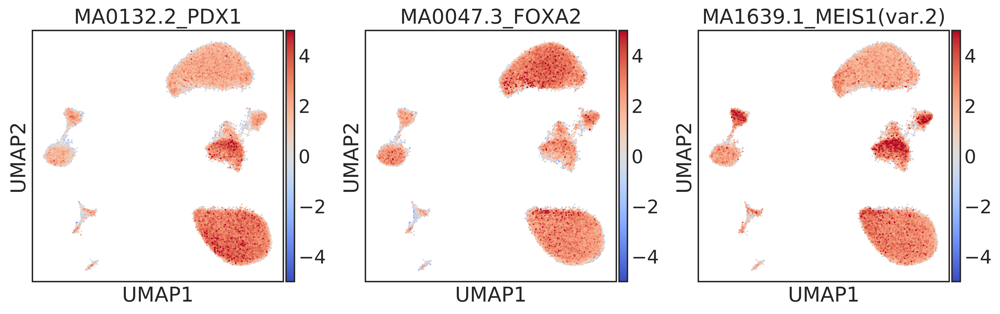

In [5]:
sc.pl.umap(adata_norm, color=['MA0132.2_PDX1','MA0047.3_FOXA2','MA1639.1_MEIS1(var.2)'], size=9, color_map='coolwarm', frameon=True,use_raw=True,save='_{}.pdf'.format('_'.join(['PDX1','FOXA2','MEIS1'])))


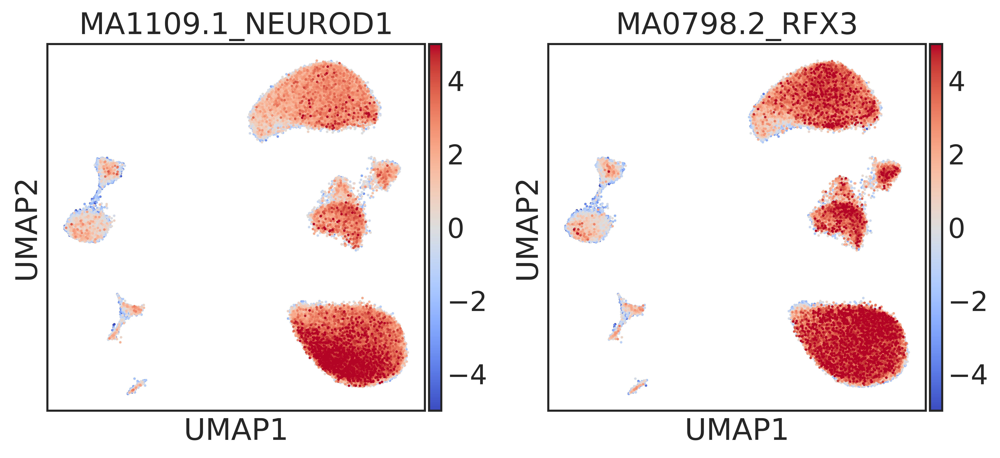

In [6]:
sc.pl.umap(adata_norm, color=['MA1109.1_NEUROD1','MA0798.2_RFX3'], size=9, color_map='coolwarm', frameon=True,use_raw=True,save='_{}.pdf'.format('_'.join(['NEUROD1','RFX3'])))

